In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import os
import matplotlib
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append('/glade/u/home/linnia/ctsm6_ppe/')
from utils.pyfunctions import *

utils_path = '/glade/u/home/linnia/ctsm6_ppe/utils/'

2025-01-24 13:01:32.937752: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-24 13:01:33.845353: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-24 13:01:33.927739: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /glade/u/apps/casper/23.10/spack/opt/spack/openmpi/4.1.6/oneapi/2023.2.1/dgcv/lib:/

In [3]:
key = '/glade/campaign/cgd/tss/projects/PPE/ctsm6_oaat/ctsm6_oaat_key.csv'
df_key = pd.read_csv(key)
la=xr.open_dataset(utils_path+'landarea_retrain_h0.nc').landarea

In [4]:
in_file = '/glade/campaign/cgd/tss/projects/PPE/ctsm6_oaat/postp/ctsm6_oaat_postp_1985-2023.nc'
ds = xr.open_dataset(in_file)

In [5]:
ds = ds.assign_coords(
    key=('ens', df_key['key'].values),
    param=('ens', df_key['param'].values),
    minmax=('ens', df_key['minmax'].values)
)

ds = ds.set_index(ens=["param", "minmax", "key"], append=True)

In [30]:
ds['stockflux'] = (ds['TOTVEGC_global_mean']/(ds['GPP_global_mean']*60*60*24*265))

In [31]:
default = ds.isel(ens=0)

### Parameter sensitivity

In [18]:
skips = []
defaults = ['xdrdt','interception_fraction','accum_factor','snw_rds_refrz','decomp_depth_efolding','tpu25ratio','default']

In [32]:
var = 'stockflux'
#cf=24*60*60*365*1e-9*la.sum()
#cf = 1e-9*la.sum()
cf = 1
#cf = 60*60*24*365
#units='(PgC/yr)'

param_list = list(set(df_key['param'].values) - set(skips))
df_sens = pd.DataFrame(index=param_list)
df_sens[var] = np.nan

#defaults = ['interception_fraction','accum_factor','snw_rds_refrz','decomp_depth_efolding']
for p,param in enumerate(param_list):
    if param in skips:
        continue  # Skip the rest of the loop for this index
    if param in defaults:
        df_sens.at[param,var] = cf*np.abs(ds[var].sel(param=param).values - default[var].values)[0]
    else:
        df_sens.at[param,var] = cf*np.abs(ds[var].sel(param=param,minmax='max').values - ds[var].sel(param=param,minmax='min').values)[0]

In [18]:
df_sens[var] = 100*(df_sens[var] / (default[var].values))

In [33]:
df_sens = df_sens.sort_values(by=[var],ascending=False)

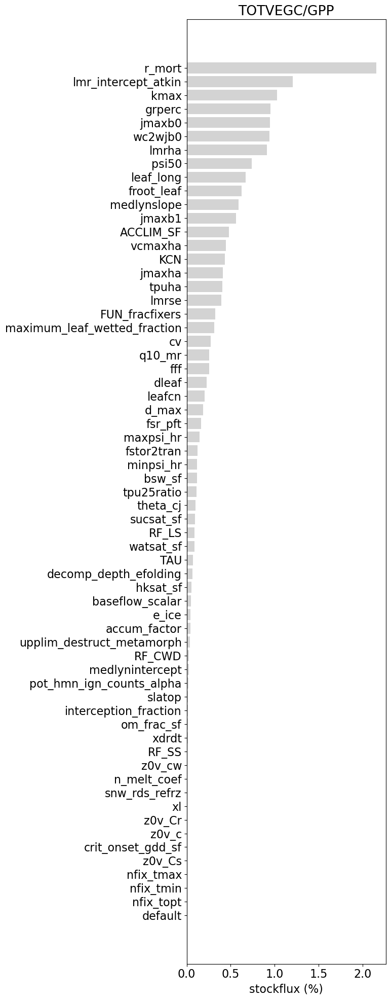

In [35]:
plt.figure(num=None, figsize=(8, 20), dpi=100, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 16})

plt.subplot(1,1,1)
plt.barh(df_sens.index.values,df_sens[var],color='lightgrey',label='OAAT sensitivity')
#plt.xticks(rotation=90)
#plt.ylabel(var+' '+units)
#plt.title(var)
plt.title('TOTVEGC/GPP')
plt.xlabel(var+' (%)')
plt.gca().invert_yaxis()
plt.tight_layout()
#plt.savefig('./figs/oaat_sens_'+var+'_percent.png')
plt.savefig('./figs/oaat_sens_TOTVEGC_GPP.png')

### Percent change 

/glade/u/home/linnia/miniconda3/envs/ppe-py/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


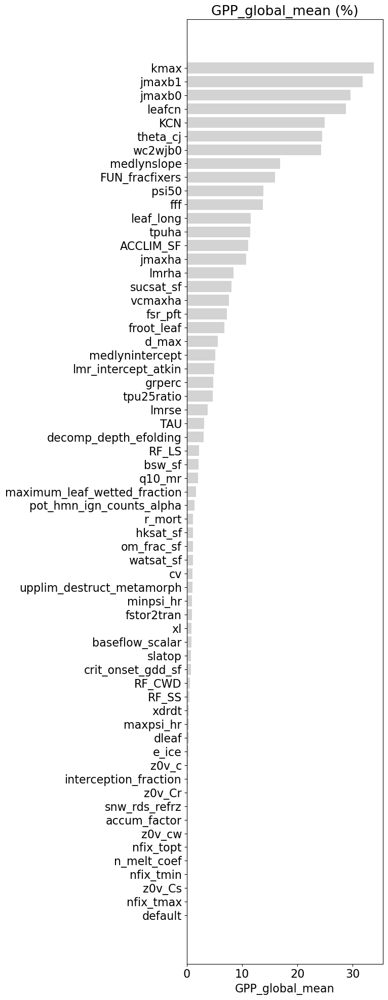

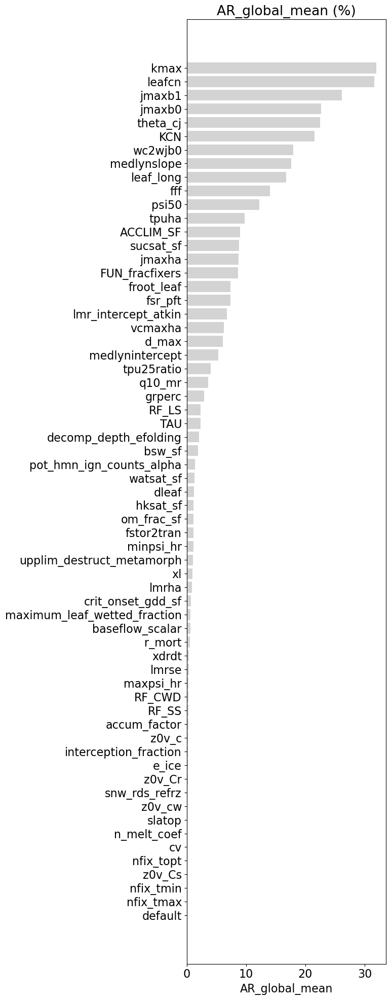

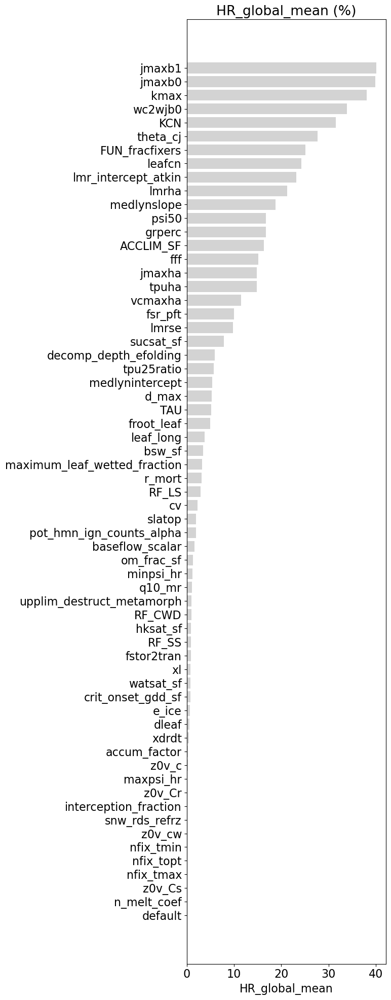

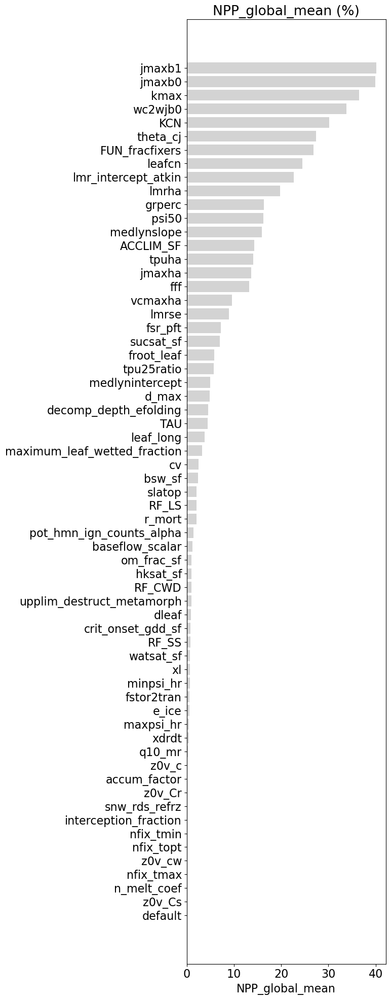

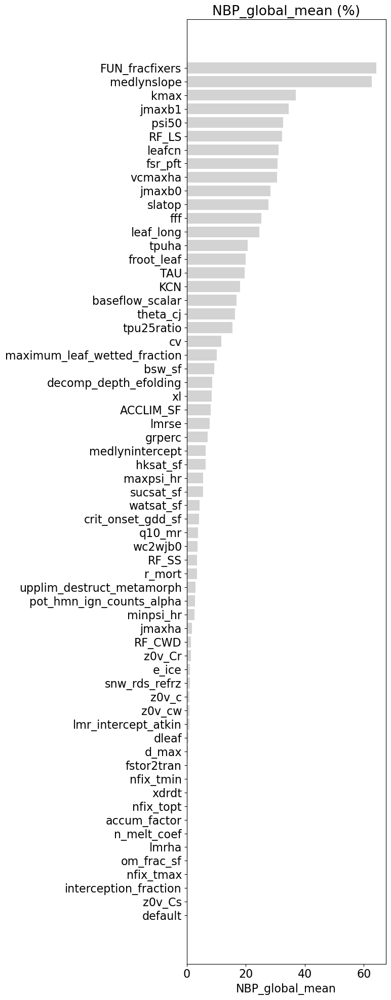

...

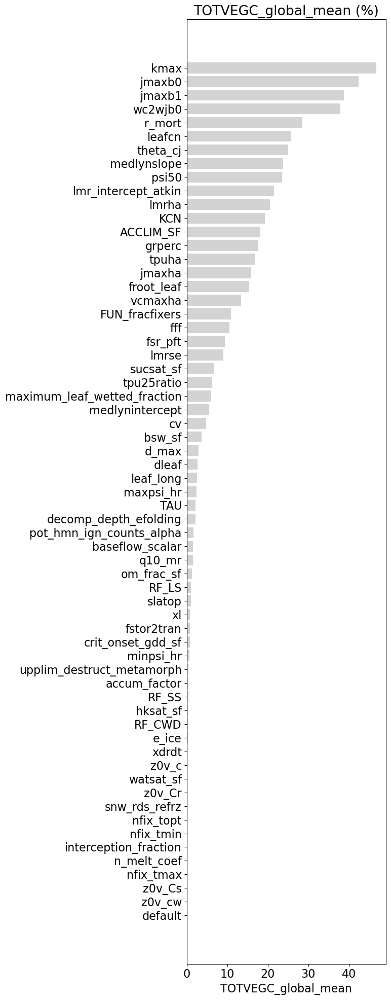

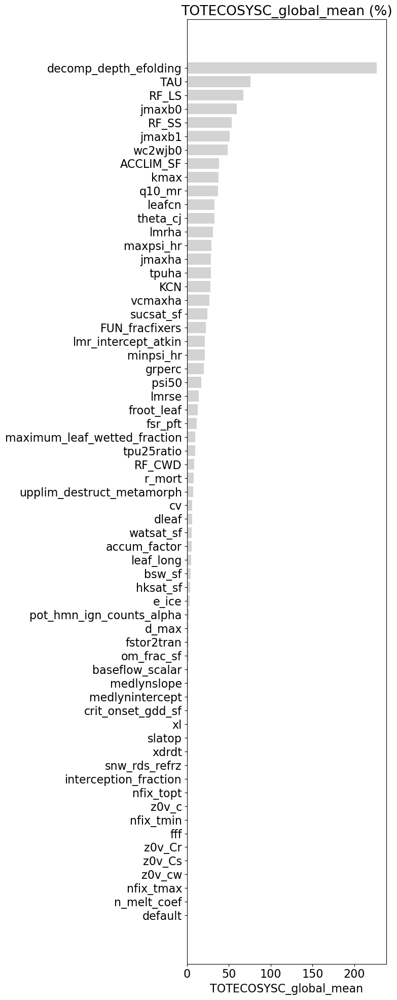

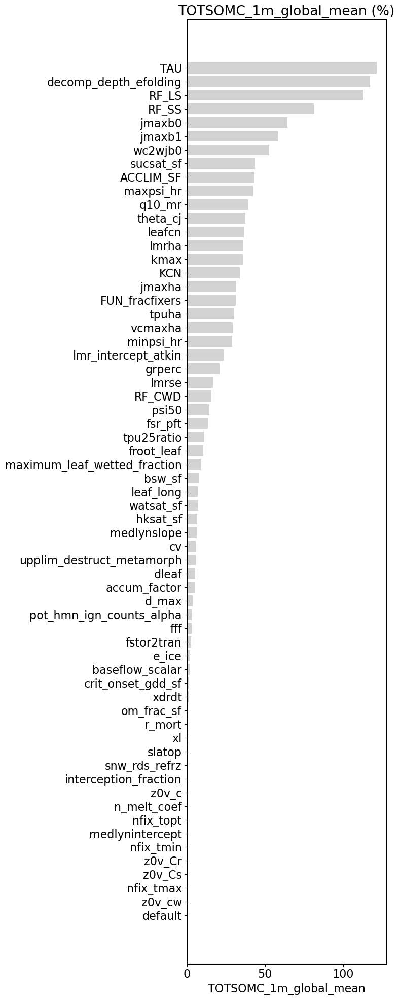

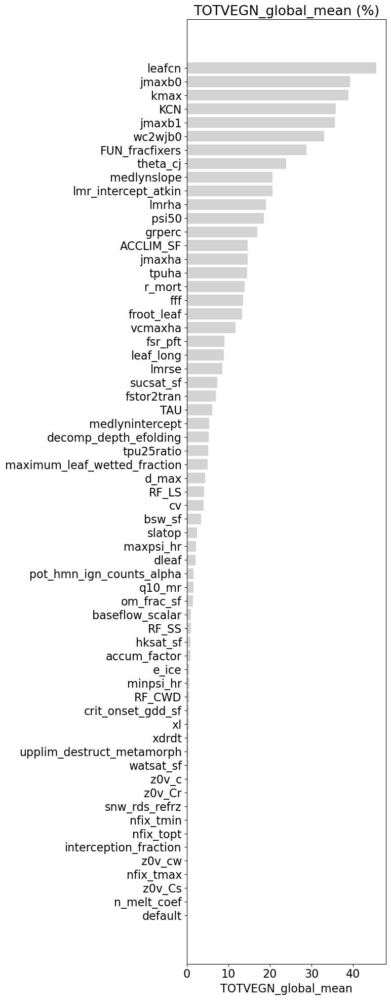

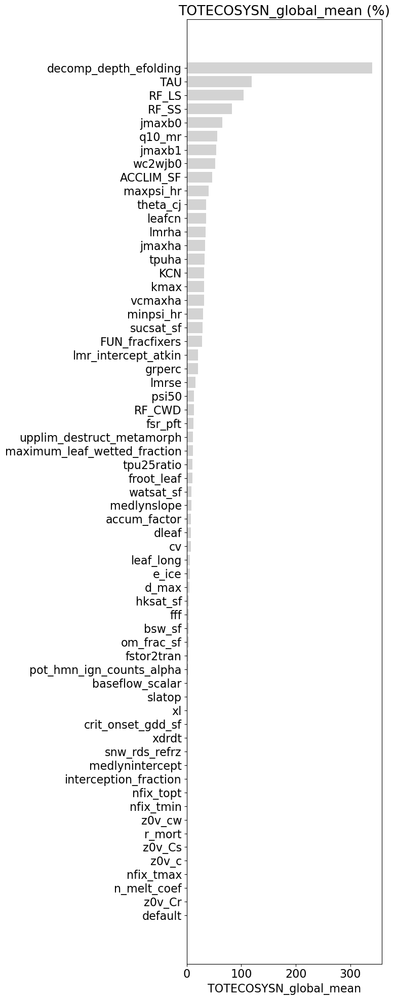

In [41]:
cf = 1
var_list = [var for var in ds.variables if var.endswith('global_mean')]
skips = []
defaults = ['xdrdt','interception_fraction','accum_factor','snw_rds_refrz','decomp_depth_efolding','tpu25ratio','default']
df_sens_all = pd.DataFrame(index=param_list,columns=var_list)

for var in var_list:

    param_list = list(set(df_key['param'].values))
    df_sens = pd.DataFrame(index=param_list)
    df_sens[var] = np.nan
    
    for p,param in enumerate(param_list):
        if param in skips:
            continue  
        if param in defaults:
            df_sens.at[param,var] = cf*np.abs(ds[var].sel(param=param).values - default[var].values)[0]
        else:
            df_sens.at[param,var] = cf*np.abs(ds[var].sel(param=param,minmax='max').values - ds[var].sel(param=param,minmax='min').values)[0]

    df_sens[var] = 100*(df_sens[var] / (default[var].values))
    df_sens_all[var] = df_sens
    df_sens = df_sens.sort_values(by=[var],ascending=False)

    plt.figure(num=None, figsize=(8, 20), dpi=100, facecolor='w', edgecolor='k')
    plt.rcParams.update({'font.size': 16})
    
    plt.subplot(1,1,1)
    plt.barh(df_sens.index.values,df_sens[var],color='lightgrey',label='OAAT sensitivity')
    plt.gca().invert_yaxis()
    plt.xlabel(var)
    plt.title(var+' (%)')
    plt.tight_layout()
    #plt.savefig('./figs/oaat_sens_'+var+'_percent.png')


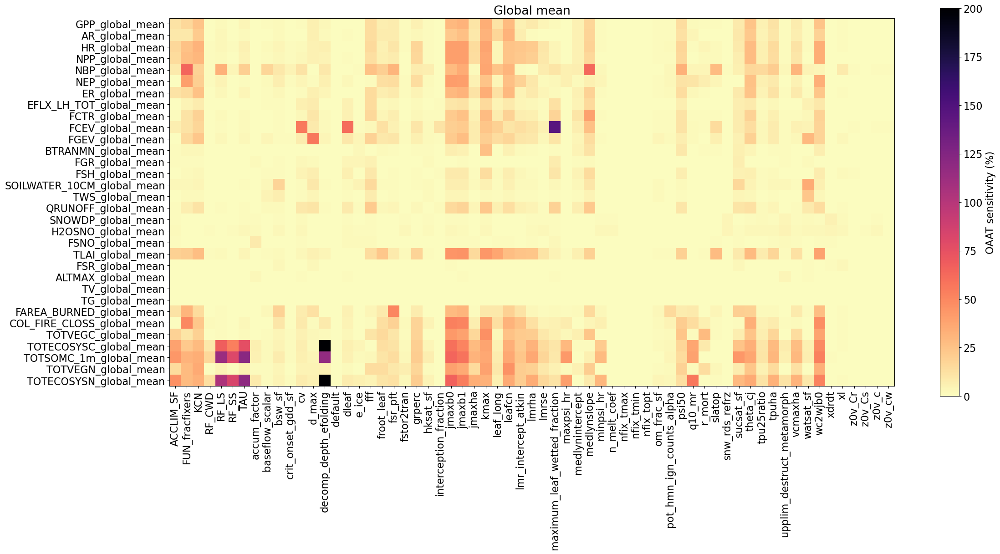

In [53]:
df = df_sens_all.sort_index()
var_names = df.columns
plt.figure(num=None, figsize=(24, 16), dpi=100, facecolor='w', edgecolor='k')
ax = plt.subplot(1,1,1)
im = ax.imshow(df.transpose(),cmap='magma_r',vmin=0,vmax=200)

# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(df.index)), labels=df.index)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.set_yticks(np.arange(len(df.columns)), labels=df.columns)

cbar = plt.colorbar(im,shrink = 0.6)
cbar.set_label("OAAT sensitivity (%)")
plt.title('Global mean')
plt.tight_layout()
plt.savefig('./figs/oaat_sens_global_heatmap.png',dpi=100)

### Biome Means

In [29]:
biome_names=xr.open_dataset(utils_path+'whit/whitkey_CRUJRA.nc').biome_name[1:].values

In [34]:
# individual variable
var = 'GPP_biome_mean'
cf = 60*60*24*365*1e-9*la.sum()
units='(PgC/yr)'

param_list = list(set(df_key['param'].values) - set(skips))
array = np.empty((len(param_list),9))
df_sens = pd.DataFrame(array, index=param_list, columns=range(1,10))

for biome in range(1,10):
    for p,param in enumerate(param_list):
        if param in skips:
            continue  
        if param in defaults:
            df_sens.at[param,biome] = cf*np.abs(ds[var].sel(param=param,biome=biome).values - default[var].sel(biome=biome).values)[0]
        else:
            df_sens.at[param,biome] = cf*np.abs(ds[var].sel(param=param,minmax='max',biome=biome).values - ds[var].sel(param=param,minmax='min',biome=biome).values)[0]

var_names = df_sens.columns
plt.figure(num=None, figsize=(24, 16), dpi=100, facecolor='w', edgecolor='k')
ax = plt.subplot(1,1,1)
im = ax.imshow(df_sens.transpose(),cmap='magma_r') #,vmin=0,vmax=0.25)

# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(param_list)), labels=param_list)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.set_yticks(np.arange(len(var_names)), labels=biome_names)

cbar = plt.colorbar(im,shrink = 0.3)
cbar.set_label(var + " sensitivity "+ units)
plt.title(var)
plt.tight_layout()
plt.savefig('./figs/oaat_sens_'+var+'_biome_heatmap.png',dpi=100)


/glade/u/home/linnia/miniconda3/envs/ppe-py/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


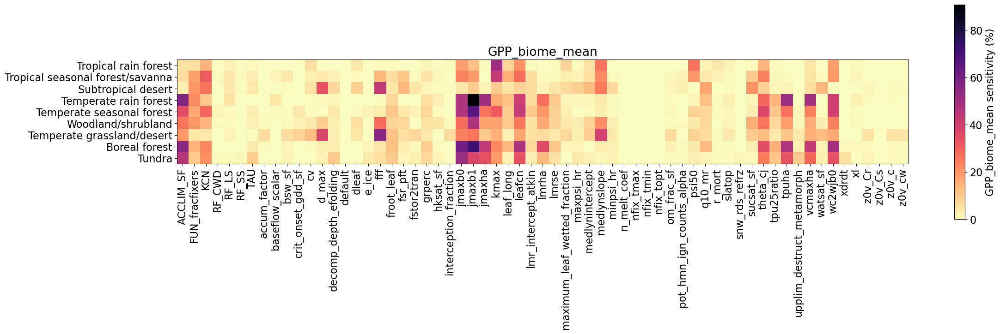

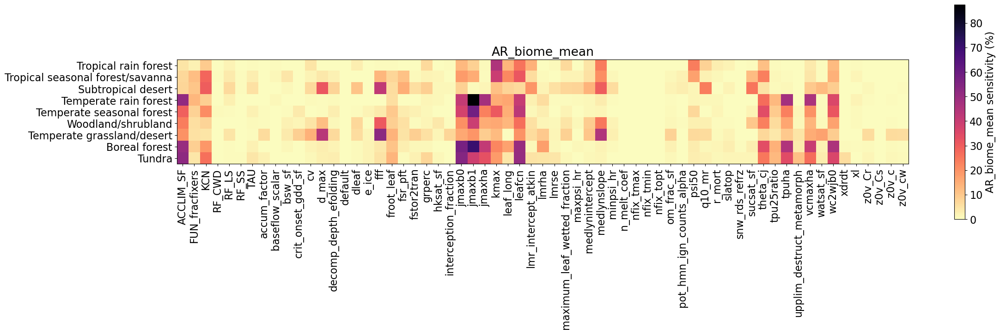

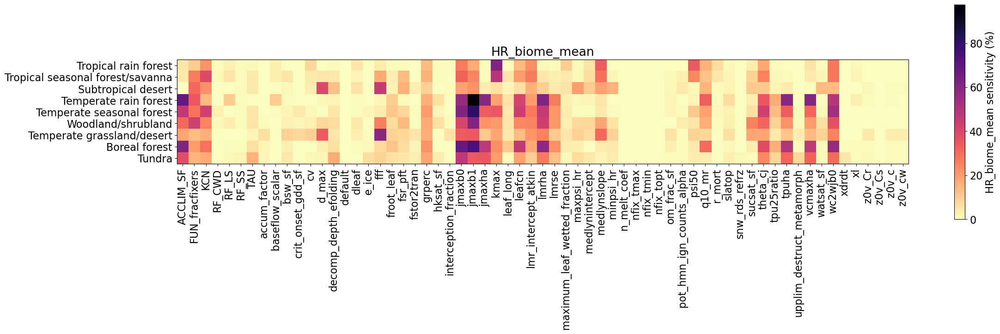

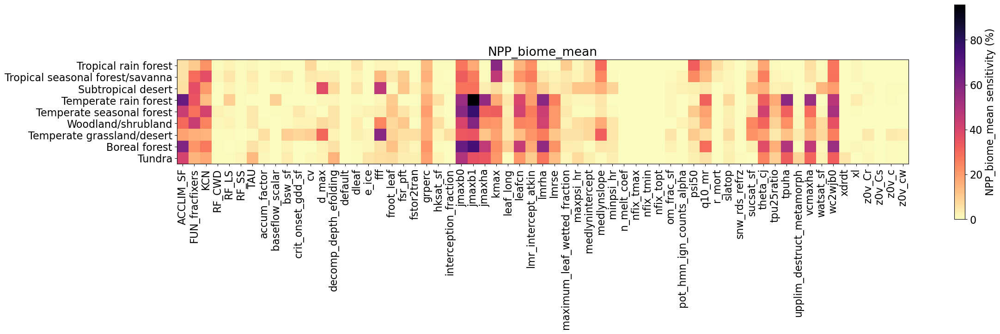

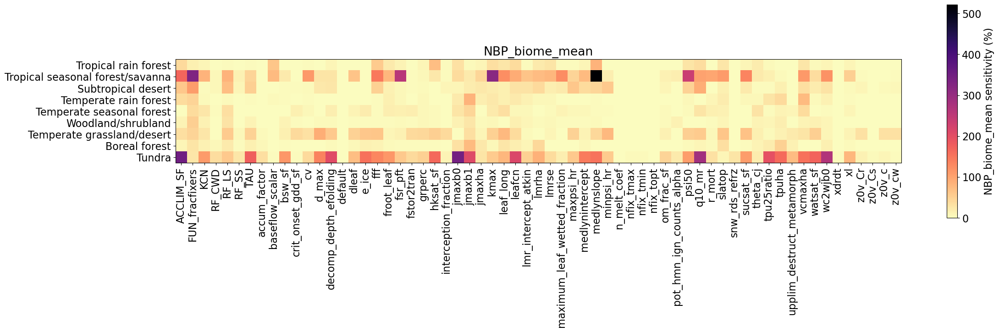

...

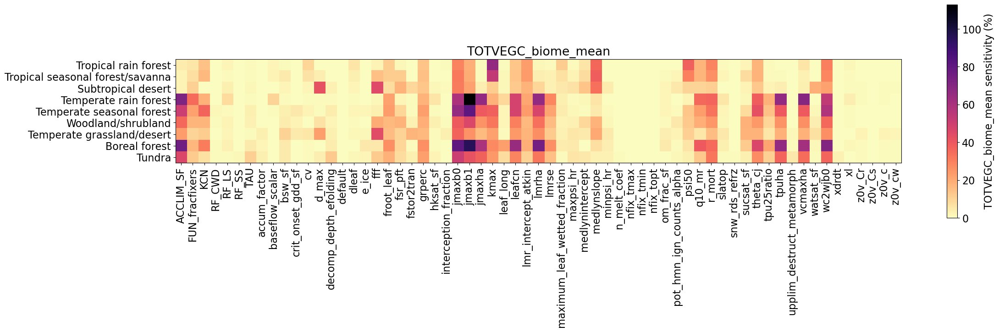

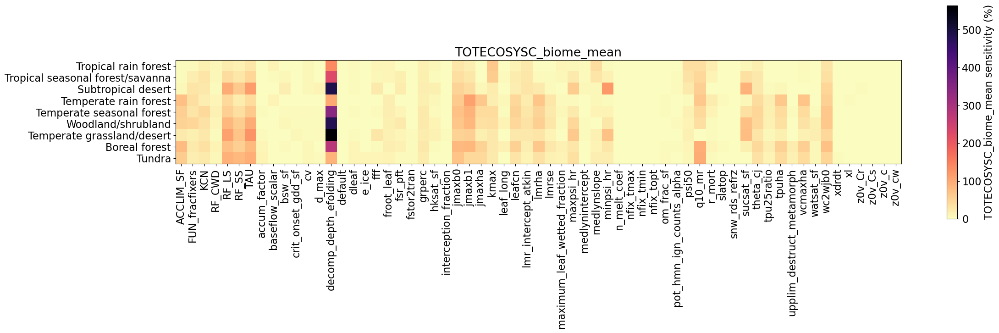

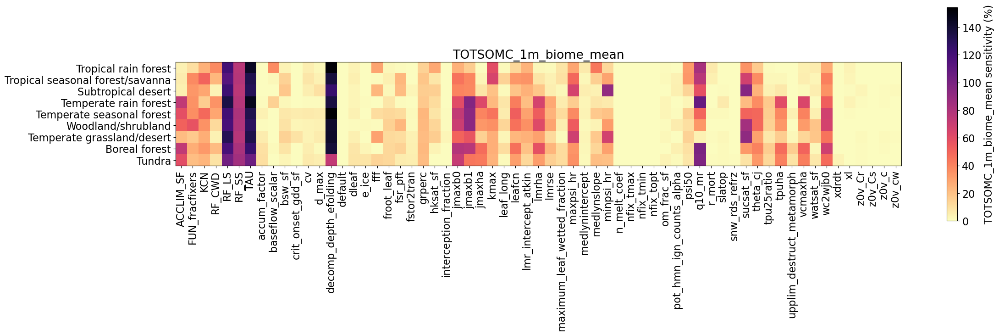

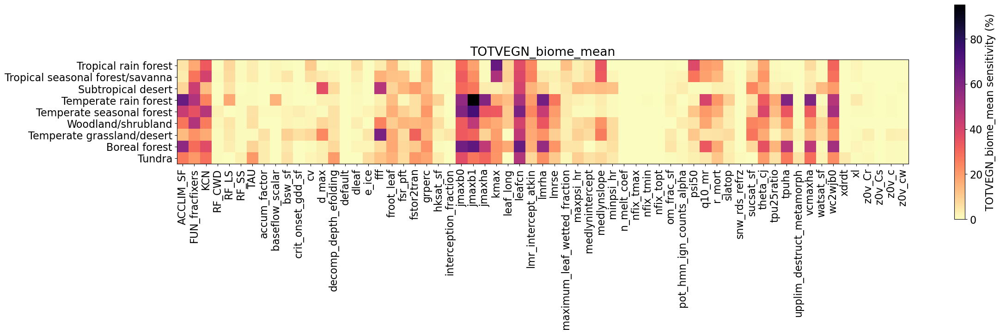

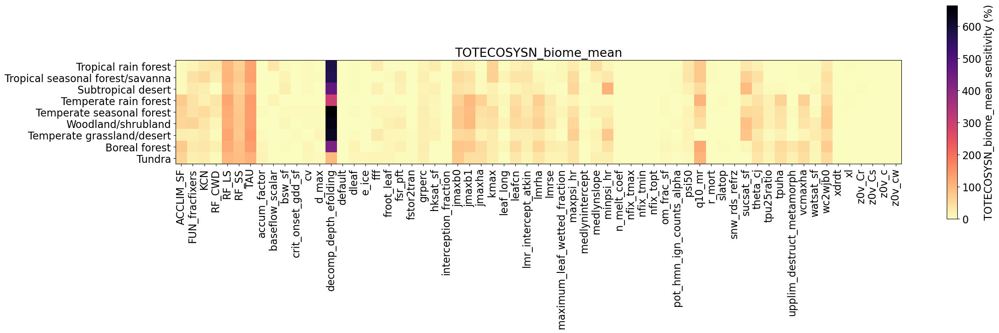

In [65]:
### All variables
cf = 1
var_list = [var for var in ds.variables if var.endswith('biome_mean')]
skips = []
defaults = ['xdrdt','interception_fraction','accum_factor','snw_rds_refrz','decomp_depth_efolding','tpu25ratio','default']

for var in var_list:

    param_list = list(set(df_key['param'].values) - set(skips))
    array = np.empty((len(param_list),9))
    df_sens = pd.DataFrame(array, index=param_list, columns=range(1,10))
    
    for biome in range(1,10):
        for p,param in enumerate(param_list):
            if param in skips:
                continue  
            if param in defaults:
                df_sens.at[param,biome] = cf*np.abs(ds[var].sel(param=param,biome=biome).values - default[var].sel(biome=biome).values)[0]
            else:
                df_sens.at[param,biome] = cf*np.abs(ds[var].sel(param=param,minmax='max',biome=biome).values - ds[var].sel(param=param,minmax='min',biome=biome).values)[0]

    df_sens = 100*(df_sens / (default[var].values[1:10]))
    
    df = df_sens.sort_index()
    plt.figure(num=None, figsize=(24, 16), dpi=100, facecolor='w', edgecolor='k')
    ax = plt.subplot(1,1,1)
    im = ax.imshow(df.transpose(),cmap='magma_r') #,vmin=0,vmax=0.25)
    
    # Show all ticks and label them with the respective list entries
    ax.set_xticks(np.arange(len(df.index)), labels=df.index)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    ax.set_yticks(np.arange(len(df.columns)), labels=biome_names)
    
    cbar = plt.colorbar(im,shrink = 0.3)
    cbar.set_label(var + " sensitivity (%)")
    plt.title(var)
    plt.tight_layout()
    plt.savefig('./figs/oaat_sens_'+var+'_biome_heatmap.png',dpi=100)


In [64]:
plt.close('all')

### NPP_NUPTAKE

In [114]:
import dask
from dask_jobqueue import PBSCluster
from dask.distributed import Client
ncores=1
nmem='10GB'
cluster = PBSCluster(
    cores=ncores, # The number of cores you want
    memory=nmem, # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='$TMPDIR', # Use your local directory
    resource_spec='select=1:ncpus='+str(ncores)+':mem='+nmem, # Specify resources
    project='P93300641', # Input your project ID here
    walltime='01:00:00', # Amount of wall time
    #interface='ib0', # Interface to use
)

# Scale up
cluster.scale(10)

# Setup your client
client = Client(cluster)

/glade/u/home/linnia/miniconda3/envs/ppe-py/lib/python3.7/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39797 instead
  f"Port {expected} is already in use.\n"


In [115]:
yy = (1985,2023)
dir='/glade/campaign/cgd/tss/projects/PPE/ctsm6_oaat/hist/'
key = '/glade/campaign/cgd/tss/projects/PPE/ctsm6_oaat/ctsm6_oaat_key.csv'
exp='oaat'
tape='h0'

dvs = ['NPP','NPP_NUPTAKE']
ds = get_exp(exp,dir,key,dvs,'h0',yy,utils_path)

In [116]:
la=xr.open_dataset(utils_path+'landarea_retrain_h0.nc').landarea
b=xr.open_dataset(utils_path+'whit/whitkey_CRUJRA.nc').biome

frac = ds.NPP_NUPTAKE / (ds.NPP + ds.NPP_NUPTAKE)
frac_bmean = bmean(amean(frac),la,b)

In [117]:
frac_bmean = frac_bmean.assign_coords(
    key=('ens', df_key['key'].values),
    param=('ens', df_key['param'].values),
    minmax=('ens', df_key['minmax'].values)
)

frac_bmean = frac_bmean.set_index(ens=["param", "minmax", "key"], append=True)

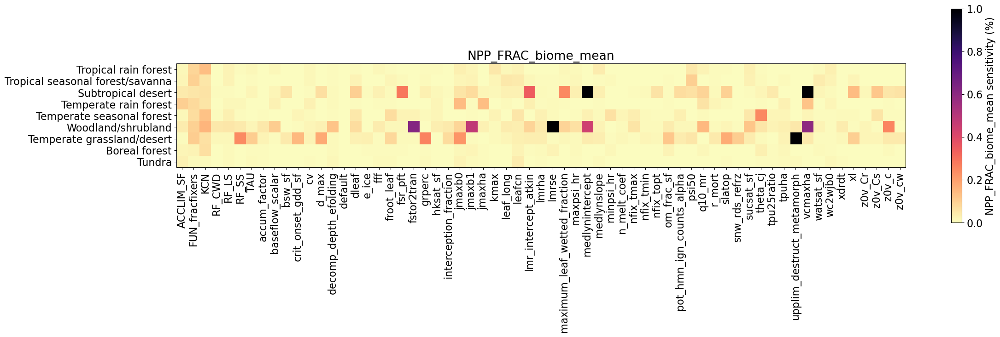

In [102]:
# individual variable
default = frac_bmean.isel(ens=0).mean(dim='year')
data = frac_bmean.mean(dim='year')
var = 'NPP_FRAC_biome_mean'
cf = 1
units='(%)'

param_list = list(set(df_key['param'].values) - set(skips))
array = np.empty((len(param_list),9))
df_sens = pd.DataFrame(array, index=param_list, columns=range(1,10))

for biome in range(1,10):
    for p,param in enumerate(param_list):
        if param in skips:
            continue  
        if param in defaults:
            df_sens.at[param,biome] = cf*np.abs(data.sel(param=param,biome=biome).values - default.sel(biome=biome).values)[0]
        else:
            df_sens.at[param,biome] = cf*np.abs(data.sel(param=param,minmax='max',biome=biome).values - data.sel(param=param,minmax='min',biome=biome).values)[0]

#df_sens = 100*(df_sens / (default.values[1:10]))
df = df_sens.sort_index()
plt.figure(num=None, figsize=(24, 16), dpi=100, facecolor='w', edgecolor='k')
ax = plt.subplot(1,1,1)
im = ax.imshow(df.transpose(),cmap='magma_r',vmin=0,vmax=1)

# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(df.index)), labels=df.index)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.set_yticks(np.arange(len(df.columns)), labels=biome_names)

cbar = plt.colorbar(im,shrink = 0.3)
cbar.set_label(var + " sensitivity "+ units)
plt.title(var)
plt.tight_layout()
#plt.savefig('./figs/oaat_sens_'+var+'_biome_heatmap.png',dpi=100)


In [127]:
frac_bmean.mean(dim='year').sel(param='nfix_tmin',minmax='max',biome=8)

<xarray.DataArray (key: 1)>
array([0.10253878])
Coordinates:
    quantile  float64 0.02
    biome     float64 8.0
  * key       (key) object 'oaat0047'

### Individual parameters

In [22]:
da = ds.EFLX_LH_TOT_biome_mean.sel(biome=2,param='medlynslope')

In [23]:
da.isel(ens=1) - da.isel(ens=0)

<xarray.DataArray 'EFLX_LH_TOT_biome_mean' ()>
array(10.62721808)
Coordinates:
    quantile  float64 0.02
    biome     float64 2.0